# Evaluate trained Yolo models on Classification problem

In [1]:
import sys
import os
import json

from pathlib import Path
from typing import Union
from IPython.display import display, HTML

import pandas as pd
import numpy as np
import altair as alt
import matplotlib.pyplot as plt

from tqdm.auto import tqdm
from PIL import Image
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

%matplotlib inline
alt.data_transformers.disable_max_rows()

display(HTML("<style>.container { width:95% !important; }</style>"))

# Load Test images

In [2]:
root = Path('/mnt/remote/data/users/thomasssajot/yolo_dataset/traffic_lights_entron_classification/focal_len=650__sensor_size_hw=1200x1920/')
images = list(root.glob('**/*.jpeg'))
print(f'Found {len(images)} images.')
assert all([f.exists() for f in images])

# Filter out UNKNOWN class:
len_before = len(images)
images = [f for f in images if f.parent.parent.parent.name != 'UNKNOWN']
print(f'/!\ WARNING /!\: Removing {len_before - len(images)} images with label `UNKNOWN`')

simplified_mapping = {
    'AMBER_SOLID': 'AMBER_SOLID',
    'GREEN_ARROW_LEFT': 'GREEN_SOLID',
    'GREEN_ARROW_RIGHT': 'GREEN_SOLID',
    'GREEN_ARROW_STRAIGHT': 'GREEN_SOLID',
    'GREEN_SOLID': 'GREEN_SOLID',
    'NONE': 'NONE',
    'RED_AND_AMBER': 'RED_AND_AMBER',
    'RED_ARROW_RIGHT': 'RED_SOLID',
    'RED_ARROW_STRAIGHT': 'RED_SOLID',
    'RED_SOLID': 'RED_SOLID',
    'UNKNOWN': 'UNKNOWN'
}
# images = [Path(str(i).replace('RED_ARROW_RIGHT', 'GREEN_SOLID')) for i in images]
ground_truth_labels = {str(i): simplified_mapping[str(i.relative_to(root)).split('/')[0]] for i in images}

Found 77939 images.
/!\ WARNING /!\: Removing 247 images with label `UNKNOWN`


# Load cached predictions

`UNKNOWN` predictions are converted to `NONE` because the test set does not include them for now. There is originally an `UNKNOWN` set of images in the test set, but these are ill-defined and are removed from it. 

In [3]:
def pred_loader(path) -> dict:
    path = Path(path)
    print('Loading:', str(path))
    with path.open('r') as f:
        payload = json.load(f)
    predictions = payload['predictions']

    # Convert UNKNWON predictions to NONE
    rar = 0
    for k in list(predictions.keys()):
        if isinstance(predictions[k], dict):
            predictions[k] = predictions[k]['colour']
        if predictions[k] == 'UNKNOWN':
            predictions[k] = 'NONE'
#         if 'RED_ARROW_RIGHT' in k:
#             rar += 1
#             predictions[k.replace('RED_ARROW_RIGHT', 'GREEN_SOLID')] = predictions[k]
#             del predictions[k]
            
    print(json.dumps(payload['metadata'], indent=4))
    print(f'Found {rar} RED_ARROW_RIGHT')
    print()
    return predictions

In [7]:
predictions = dict(
    cross_prod=pred_loader('./cache/yolov5x6_1280_cross_prod_entron_tl_classification_1280_get_colour_most_relevant.json'),
    cross_prod_1600=pred_loader('./cache/yolov5x6_1280_cross_prod_entron_tl_classification_1600_get_colour_most_relevant.json'),
    cross_prod_1920=pred_loader('./cache/yolov5x6_1280_cross_prod_entron_tl_classification_1920_get_colour_most_relevant.json'),
#     cross_prod_balanced=pred_loader('./cache/yolov5x6_1280_cross_prod_balanced_entron_tl_classification_1280_get_colour_most_relevant.json'),
    cross_prod_visible_only=pred_loader('./cache/yolov5x6_1280_cross_prod_visible_only_entron_tl_classification_1280_get_colour_most_relevant.json'),
#     multi_label=pred_loader('./cache/yolov5x6_1280_multi_label_entron_tl_classification_1280_get_colour_most_relevant.json'),
#     multi_label_balanced=pred_loader('./cache/yolov5x6_1280_multi_label_balanced_entron_tl_classification_1280_get_colour_most_relevant.json'),
)

Loading: cache/yolov5x6_1280_cross_prod_entron_tl_classification_1280_get_colour_most_relevant.json
{
    "model": "./runs/traffic_light_2020_undistorted/yolov5x6_1280_cross_prod_epoch=3003/weights/best.pt",
    "image_size": [
        1280
    ],
    "image_root": "../yolo_dataset/traffic_lights_entron_classification/"
}
Found 0 RED_ARROW_RIGHT

Loading: cache/yolov5x6_1280_cross_prod_entron_tl_classification_1600_get_colour_most_relevant.json
{
    "model": "./runs/traffic_light_2020_undistorted/yolov5x6_1280_cross_prod_epoch=3003/weights/best.pt",
    "image_size": [
        1600
    ],
    "image_root": "../yolo_dataset/traffic_lights_entron_classification/"
}
Found 0 RED_ARROW_RIGHT

Loading: cache/yolov5x6_1280_cross_prod_entron_tl_classification_1920_get_colour_most_relevant.json
{
    "model": "./runs/traffic_light_2020_undistorted/yolov5x6_1280_cross_prod_epoch=3003/weights/best.pt",
    "image_size": [
        1920
    ],
    "image_root": "../yolo_dataset/traffic_lights_entr

# Evaluate

In [8]:
def generate_report(gt, preds, title='Confusion matrix'):
    # ensure the order of predictions is the same as ground truth
    selected_y_pred = []
    selected_y_true = []
    for k, v in gt.items():
        selected_y_pred.append(preds[k])
        selected_y_true.append(gt[k])
    labels = sorted(set(selected_y_true))
    print('')
    print(classification_report(y_true=selected_y_true, y_pred=selected_y_pred, digits=3))

    cm = confusion_matrix(y_true=selected_y_true, y_pred=selected_y_pred, normalize='true', labels=labels)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm * 100, display_labels=labels)

    _, ax = plt.subplots(dpi=120, figsize=(5, 5))
    disp.plot(xticks_rotation='vertical', values_format='.1f', ax=ax)
    plt.title(title)
    plt.show()

cross_prod

               precision    recall  f1-score   support

  AMBER_SOLID      0.433     0.562     0.490      1058
  GREEN_SOLID      0.873     0.835     0.854     18008
         NONE      0.784     0.890     0.833     21315
RED_AND_AMBER      0.925     0.772     0.841      1830
    RED_SOLID      0.958     0.901     0.928     35481

     accuracy                          0.875     77692
    macro avg      0.795     0.792     0.789     77692
 weighted avg      0.883     0.875     0.877     77692



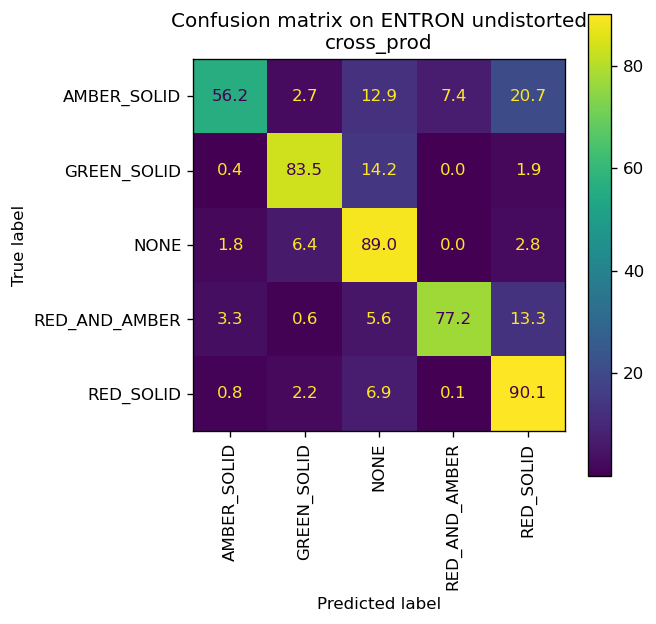

cross_prod_1600

               precision    recall  f1-score   support

  AMBER_SOLID      0.536     0.658     0.591      1058
  GREEN_SOLID      0.876     0.831     0.853     18008
         NONE      0.801     0.897     0.847     21315
RED_AND_AMBER      0.939     0.829     0.881      1830
    RED_SOLID      0.957     0.912     0.934     35481

     accuracy                          0.884     77692
    macro avg      0.822     0.825     0.821     77692
 weighted avg      0.889     0.884     0.885     77692



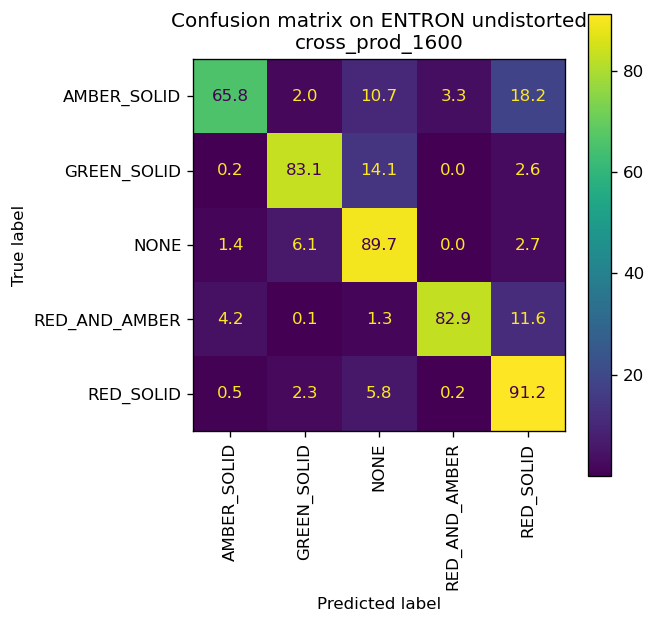

cross_prod_1920

               precision    recall  f1-score   support

  AMBER_SOLID      0.546     0.578     0.561      1058
  GREEN_SOLID      0.876     0.842     0.859     18008
         NONE      0.798     0.903     0.847     21315
RED_AND_AMBER      0.883     0.834     0.858      1830
    RED_SOLID      0.949     0.893     0.920     35481

     accuracy                          0.878     77692
    macro avg      0.810     0.810     0.809     77692
 weighted avg      0.883     0.878     0.879     77692



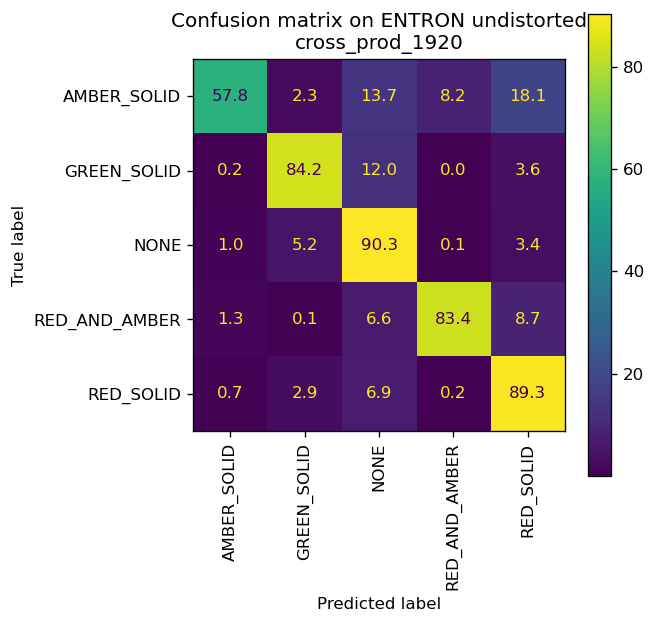

cross_prod_visible_only



/home/thomassajot/miniconda3/envs/yolov5/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/thomassajot/miniconda3/envs/yolov5/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/thomassajot/miniconda3/envs/yolov5/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, m

               precision    recall  f1-score   support

  AMBER_SOLID      0.000     0.000     0.000      1058
  GREEN_SOLID      0.797     0.839     0.818     18008
         NONE      0.348     0.926     0.506     21315
RED_AND_AMBER      0.731     0.826     0.776      1830
    RED_SOLID      0.000     0.000     0.000     35481

     accuracy                          0.468     77692
    macro avg      0.375     0.518     0.420     77692
 weighted avg      0.298     0.468     0.347     77692



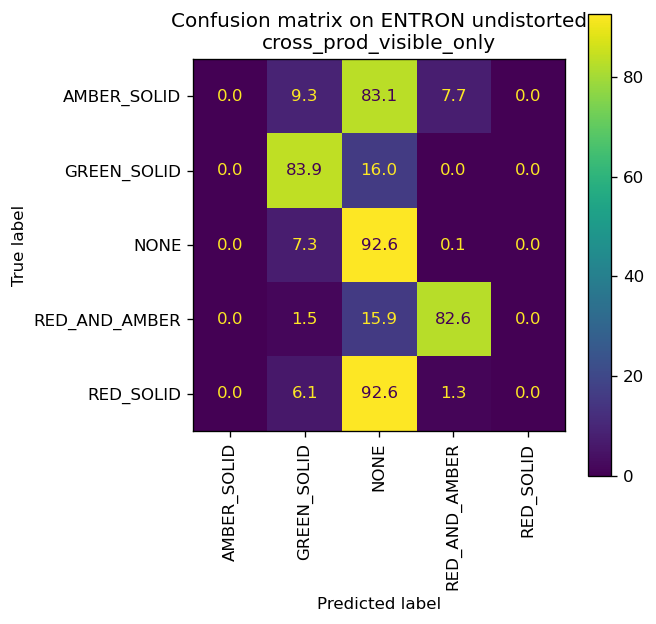

In [10]:
for k, v in predictions.items():
    print('=' * 100)
    print(k)
    generate_report(ground_truth_labels, v, title=f'Confusion matrix on ENTRON undistorted\n{k}')

# Look at mistakes predictions

In [11]:
def predictions_to_dataframe(preds, gt):
    df = pd.DataFrame(preds.items(), columns=['file', 'pred'])
    gt = pd.DataFrame(gt.items(), columns=['file', 'gt'])
    df = df.merge(gt, on='file', how='right')
    assert df.isna().any().any() == False

    file_ending = df['file'].str.replace('/mnt/remote/data/users/thomasssajot/yolo_dataset/traffic_lights_entron_classification/focal_len=650__sensor_size_hw=1200x1920/', '')
    run_id_and_filename = file_ending.str.split('/', n=1, regex=False).str.get(1).str.rsplit('/', n=1)
    df['run_id'] = run_id_and_filename.str.get(0)
    df['timestamp'] = run_id_and_filename.str.get(1).str.replace('unixus.jpeg', '', regex=False).astype(int)
    df = df.sort_values(['run_id', 'timestamp']).reset_index(drop=True)

    time_delta = 100000 # 100ms
    df['seq'] = df.groupby('run_id', group_keys=False)['timestamp'].apply(lambda ts: (ts.diff(1).fillna(0) >= time_delta).cumsum())
    df = df.groupby(['run_id', 'seq'], as_index = False).apply(lambda x: x.reset_index(drop=True).reset_index()).reset_index(drop=True)
    return df


def num_changes_per_sec(seq_df):
    num_changes = (seq_df['pred'] != seq_df['pred'].shift(1).backfill()).sum()
    duration_s = (seq_df['timestamp'].max() - seq_df['timestamp'].min()) / 1e6
    return num_changes / duration_s

In [12]:
cross_prod = predictions_to_dataframe(predictions['cross_prod_visible_only'], ground_truth_labels).query('pred != gt')
cross_prod.head()

,index,file,pred,gt,run_id,timestamp,seq
0,0,/mnt/remote/data/users/thomasssajot/yolo_datas...,NONE,GREEN_SOLID,brizo/2022-08-12--08-02-47--session_2022_06_09...,1660291434060284,0
2,2,/mnt/remote/data/users/thomasssajot/yolo_datas...,NONE,GREEN_SOLID,brizo/2022-08-12--08-02-47--session_2022_06_09...,1660291434140867,0
3,3,/mnt/remote/data/users/thomasssajot/yolo_datas...,NONE,GREEN_SOLID,brizo/2022-08-12--08-02-47--session_2022_06_09...,1660291434180533,0
7,7,/mnt/remote/data/users/thomasssajot/yolo_datas...,NONE,GREEN_SOLID,brizo/2022-08-12--08-02-47--session_2022_06_09...,1660291434339681,0
8,8,/mnt/remote/data/users/thomasssajot/yolo_datas...,NONE,GREEN_SOLID,brizo/2022-08-12--08-02-47--session_2022_06_09...,1660291434382491,0


RED_AND_AMBER
/mnt/remote/data/users/thomasssajot/yolo_dataset/traffic_lights_entron_classification/focal_len=650__sensor_size_hw=1200x1920/RED_SOLID/sedna/2022-05-25--13-27-18--session_2022_04_09_05_21_52_host_zak_complex_intersections2/1653486003314721unixus.jpeg


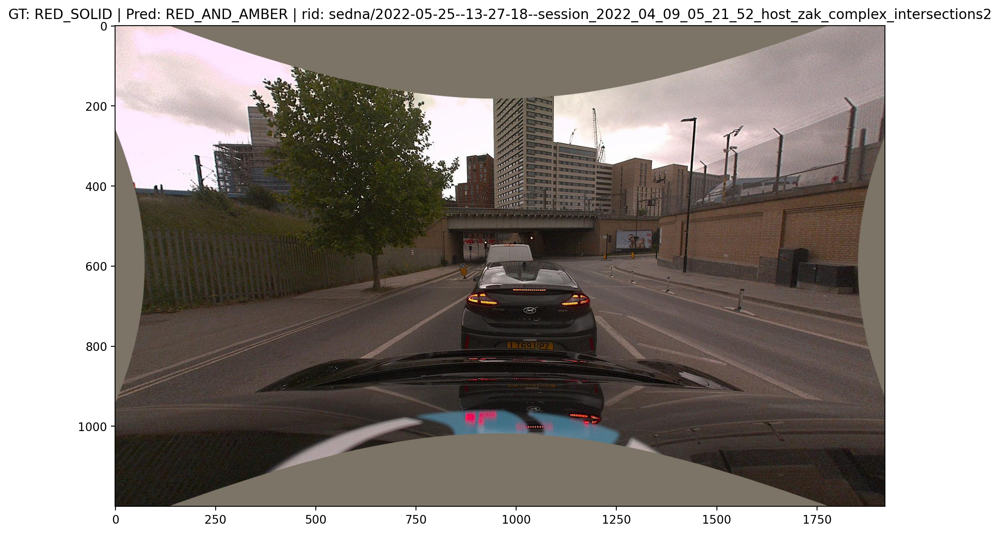

NONE
/mnt/remote/data/users/thomasssajot/yolo_dataset/traffic_lights_entron_classification/focal_len=650__sensor_size_hw=1200x1920/RED_SOLID/nereus/2022-08-17--13-53-40--Shirley/1660745411544371unixus.jpeg


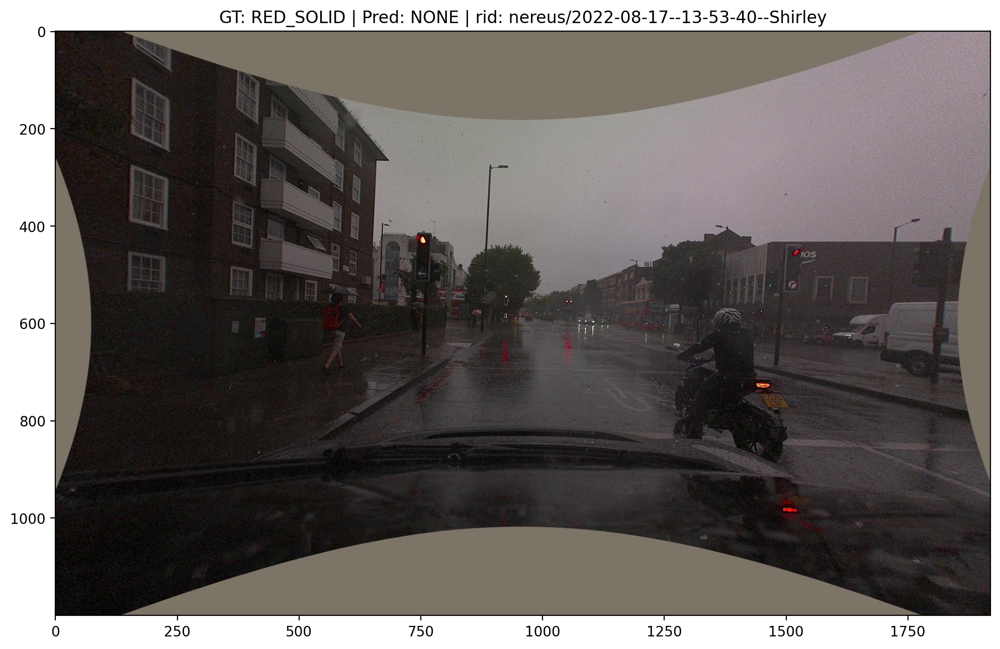

NONE
/mnt/remote/data/users/thomasssajot/yolo_dataset/traffic_lights_entron_classification/focal_len=650__sensor_size_hw=1200x1920/RED_SOLID/brizo/2022-08-12--08-02-47--session_2022_06_09_12_49_14_aml-v100-2nn-2_tomnewton_full_databricks_data_pipeline/1660291534273624unixus.jpeg


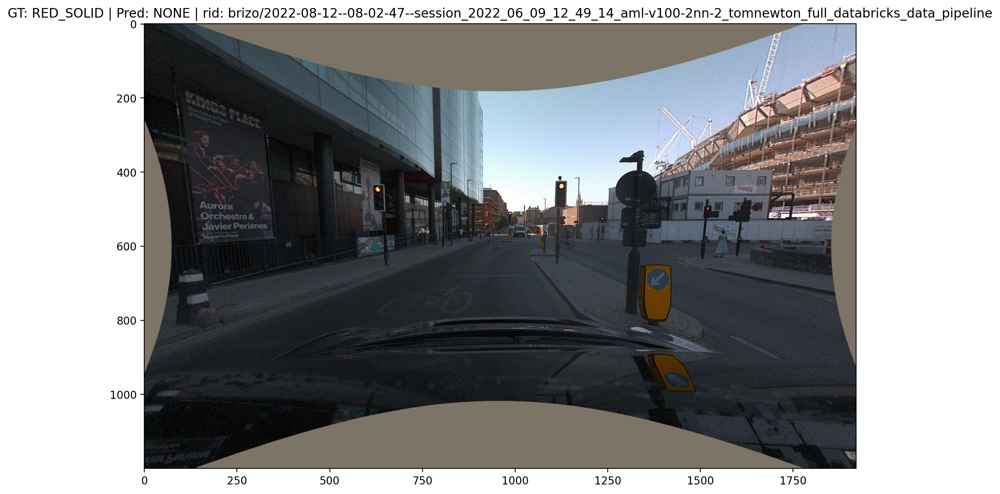

NONE
/mnt/remote/data/users/thomasssajot/yolo_dataset/traffic_lights_entron_classification/focal_len=650__sensor_size_hw=1200x1920/RED_SOLID/nereus/2022-08-17--13-53-40--Shirley/1660745399185762unixus.jpeg


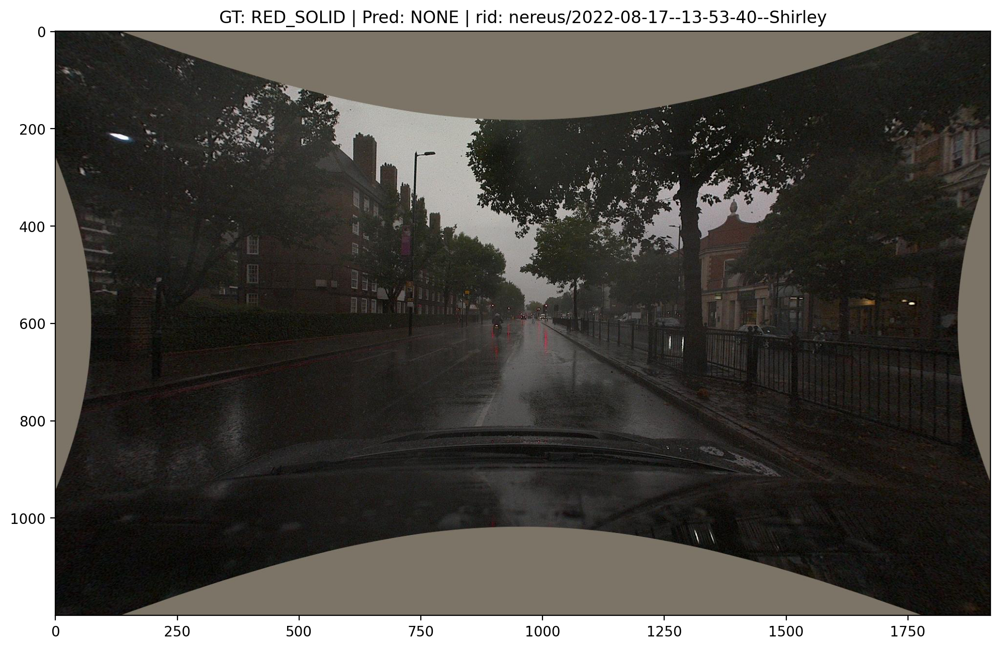

NONE
/mnt/remote/data/users/thomasssajot/yolo_dataset/traffic_lights_entron_classification/focal_len=650__sensor_size_hw=1200x1920/RED_SOLID/sedna/2022-08-10--10-47-42--session_2022_06_07_21_24_09_aml-v100-2nn-0_piotr_mf_balanceapece_entron_no0_80_int_newdata/1660128649319474unixus.jpeg


In [ ]:
for _, (_, file, p, gt, rid, _, _) in cross_prod.sample(60, random_state=123)[-20:].iterrows():
    print(p)
    print(file)
    plt.figure(figsize=(12, 12), dpi=200)
    plt.imshow(Image.open(file))
    plt.title(f'GT: {gt} | Pred: {p} | rid: {rid}')
    plt.show()

# Measure Changes per second

In [20]:
df = predictions_to_dataframe(predictions_cross_prod, ground_truth_labels)
df.groupby(['run_id', 'seq', 'gt']).apply(num_changes_per_sec).mean()

1.3803649457921072

In [16]:
df = predictions_to_dataframe(ground_truth_labels, ground_truth_labels)
df.groupby(['run_id', 'seq', 'gt']).apply(num_changes_per_sec).mean()

0.0

In [22]:
df = predictions_to_dataframe(predictions_multi_class, ground_truth_labels)
df.groupby(['run_id', 'seq', 'gt']).apply(num_changes_per_sec).mean()

2.2138261847061043

In [224]:
for name, g in df.groupby(['run_id', 'seq']):
    break
g

,index,file,pred,gt,run_id,timestamp,seq
0,0,/mnt/remote/data/users/thomasssajot/yolo_datas...,NONE,GREEN_SOLID,brizo/2022-08-12--08-02-47--session_2022_06_09...,1660291434060284,0
1,1,/mnt/remote/data/users/thomasssajot/yolo_datas...,NONE,GREEN_SOLID,brizo/2022-08-12--08-02-47--session_2022_06_09...,1660291434102265,0
2,2,/mnt/remote/data/users/thomasssajot/yolo_datas...,NONE,GREEN_SOLID,brizo/2022-08-12--08-02-47--session_2022_06_09...,1660291434140867,0
3,3,/mnt/remote/data/users/thomasssajot/yolo_datas...,NONE,GREEN_SOLID,brizo/2022-08-12--08-02-47--session_2022_06_09...,1660291434180533,0
4,4,/mnt/remote/data/users/thomasssajot/yolo_datas...,NONE,GREEN_SOLID,brizo/2022-08-12--08-02-47--session_2022_06_09...,1660291434218837,0
...,...,...,...,...,...,...,...
167,167,/mnt/remote/data/users/thomasssajot/yolo_datas...,GREEN_SOLID,GREEN_SOLID,brizo/2022-08-12--08-02-47--session_2022_06_09...,1660291440740639,0
168,168,/mnt/remote/data/users/thomasssajot/yolo_datas...,GREEN_SOLID,GREEN_SOLID,brizo/2022-08-12--08-02-47--session_2022_06_09...,1660291440781404,0
169,169,/mnt/remote/data/users/thomasssajot/yolo_datas...,GREEN_SOLID,GREEN_SOLID,brizo/2022-08-12--08-02-47--session_2022_06_09...,1660291440820077,0
170,170,/mnt/remote/data/users/thomasssajot/yolo_datas...,GREEN_SOLID,GREEN_SOLID,brizo/2022-08-12--08-02-47--session_2022_06_09...,1660291440865771,0


In [229]:
g['pred'].shift(1).backfill()

0             NONE
1             NONE
2             NONE
3             NONE
4             NONE
          ...     
167    GREEN_SOLID
168    GREEN_SOLID
169    GREEN_SOLID
170    GREEN_SOLID
171    GREEN_SOLID
Name: pred, Length: 172, dtype: object

2.1935423866969552

In [10]:

df = predictions_to_dataframe(predictions_cross_prod, ground_truth_labels)
df = pd.melt(df, value_vars=['gt', 'pred'], id_vars=['index', 'file', 'run_id', 'timestamp', 'seq'])
df = df.sort_values(['run_id', 'timestamp', 'seq', 'index', 'variable']).reset_index(drop=True)

source = df.copy(deep=True)
source['facet'] = df['run_id'] + '_' + df['seq'].astype(str)
source = source[source['run_id'].str.startswith('sedna/2022-08-10--10-47-42--session_2022_06_07_21_24_09_aml')]

alt.Chart(source).mark_line().encode(
    x='index',
    y='value',
    order='index',
    color='variable'
).facet(
    facet='facet', columns=2,
).resolve_scale(x='independent', y='independent')

In [11]:

df = predictions_to_dataframe(predictions_multi_class, ground_truth_labels)
df = pd.melt(df, value_vars=['gt', 'pred'], id_vars=['index', 'file', 'run_id', 'timestamp', 'seq'])
df = df.sort_values(['run_id', 'timestamp', 'seq', 'index', 'variable']).reset_index(drop=True)

source = df.copy(deep=True)
source['facet'] = df['run_id'] + '_' + df['seq'].astype(str)
source = source[source['run_id'].str.startswith('sedna/2022-08-10--10-47-42--session_2022_06_07_21_24_09_aml')]

alt.Chart(source).mark_line().encode(
    x='index',
    y='value',
    order='index',
    color='variable'
).facet(
    facet='facet', columns=2,
).resolve_scale(x='independent', y='independent')

In [ ]:
¡